pdf: [link](https://drive.google.com/file/d/1_iAoeSBKV4bNeiB6tuNLeeCUvMxaWzL6/view?usp=sharing)

video: [link](https://drive.google.com/file/d/1Spyb1cTB3uswaQ9eNlwdafyPXzY6BLQv/view?usp=sharing)

colab: [link](https://colab.research.google.com/drive/1b836Rud2MpQvuhYfFshc_7J1U6SQzA_f?usp=sharing)

paper: [link](https://proceedings.neurips.cc/paper/2014/file/5ca3e9b122f61f8f06494c97b1afccf3-Paper.pdf)


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw

Epoch [0/100] Batch 0/938                       Loss D: 0.6252, loss G: 0.6487
Epoch [1/100] Batch 0/938                       Loss D: 0.1760, loss G: 2.1498
Epoch [2/100] Batch 0/938                       Loss D: 0.3019, loss G: 1.5846
Epoch [3/100] Batch 0/938                       Loss D: 0.4790, loss G: 1.1201
Epoch [4/100] Batch 0/938                       Loss D: 0.5791, loss G: 0.9915
Epoch [5/100] Batch 0/938                       Loss D: 0.9526, loss G: 0.5886
Epoch [6/100] Batch 0/938                       Loss D: 0.5464, loss G: 0.9704
Epoch [7/100] Batch 0/938                       Loss D: 0.2037, loss G: 2.0752
Epoch [8/100] Batch 0/938                       Loss D: 0.4884, loss G: 1.1484
Epoch [9/100] Batch 0/938                       Loss D: 0.4022, loss G: 1.5067
Epoch [10/100] Batch 0/938                       Loss D: 0.8079, loss G: 0.6931


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


Epoch [11/100] Batch 0/938                       Loss D: 0.4843, loss G: 1.0292
Epoch [12/100] Batch 0/938                       Loss D: 0.5507, loss G: 1.0384
Epoch [13/100] Batch 0/938                       Loss D: 0.5923, loss G: 1.0178
Epoch [14/100] Batch 0/938                       Loss D: 0.6676, loss G: 1.0385
Epoch [15/100] Batch 0/938                       Loss D: 0.6795, loss G: 0.8954
Epoch [16/100] Batch 0/938                       Loss D: 0.5963, loss G: 1.2990
Epoch [17/100] Batch 0/938                       Loss D: 0.7660, loss G: 1.1698
Epoch [18/100] Batch 0/938                       Loss D: 0.4197, loss G: 1.6560
Epoch [19/100] Batch 0/938                       Loss D: 0.4541, loss G: 1.3783
Epoch [20/100] Batch 0/938                       Loss D: 0.4531, loss G: 1.4923
Epoch [21/100] Batch 0/938                       Loss D: 0.2804, loss G: 1.8242
Epoch [22/100] Batch 0/938                       Loss D: 0.5636, loss G: 1.3048
Epoch [23/100] Batch 0/938              

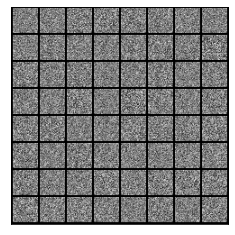

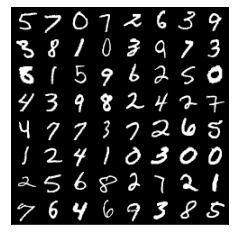

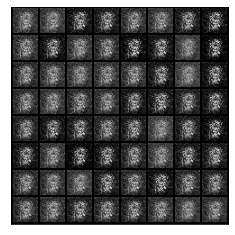

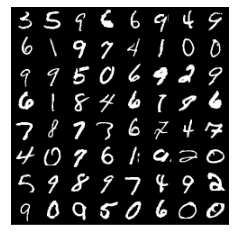

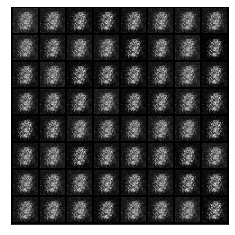

...

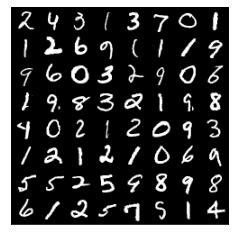

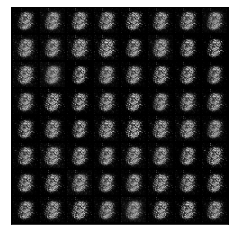

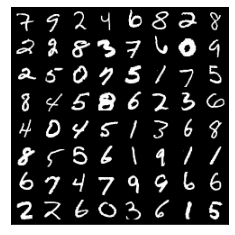

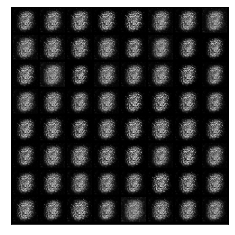

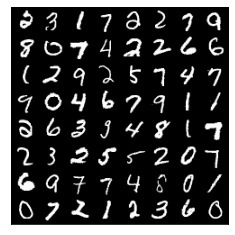

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
import numpy as np

# show results
def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fix, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

class Discriminator(nn.Module):
    def __init__(self, in_features):
        super().__init__()
        self.disc = nn.Sequential(
            nn.Linear(in_features, 128), # in_feature = 28*28*1
            nn.LeakyReLU(0.01),  # torch.nn.LeakyReLU(negative_slope=0.01, inplace=False)
            nn.Linear(128, 1),
            nn.Sigmoid(), # fake=0, real=1
        )

    def forward(self, x):
        return self.disc(x)


class Generator(nn.Module):
    def __init__(self, z_dim, img_dim):
        super().__init__()
        self.gen = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.LeakyReLU(0.01),
            nn.Linear(256, img_dim),
            nn.Tanh(),  # normalize inputs to [-1, 1] so make outputs [-1, 1]
        )

    def forward(self, x):
        return self.gen(x)


# Hyperparameters etc.
device = "cuda" if torch.cuda.is_available() else "cpu"
lr = 3e-4 # suggested
z_dim = 128 # 64, 128, 256 
image_dim = 28 * 28 * 1  # 784
batch_size = 64
num_epochs = 100

disc = Discriminator(image_dim).to(device)
gen = Generator(z_dim, image_dim).to(device)

fixed_noise = torch.randn((batch_size, z_dim)).to(device)

transforms = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,)),]
)

dataset = datasets.MNIST(root="dataset/", transform=transforms, download=True)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

opt_disc = optim.Adam(disc.parameters(), lr=lr)
opt_gen = optim.Adam(gen.parameters(), lr=lr)

criterion = nn.BCELoss()
grid_fake = []
grid_real = []
for epoch in range(num_epochs):
    for batch_idx, (real, _) in enumerate(loader): # _ = labels (dont we use them)
        real = real.view(-1, 784).to(device)
        batch_size = real.shape[0]

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).view(-1)
        lossD_real = criterion(disc_real, torch.ones_like(disc_real))

        noise = torch.randn(batch_size, z_dim).to(device)
        fake = gen(noise)
        disc_fake = disc(fake).view(-1)
        lossD_fake = criterion(disc_fake, torch.zeros_like(disc_fake))

        lossD = (lossD_real + lossD_fake) / 2

        disc.zero_grad()
        lossD.backward(retain_graph=True)
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        # where the second option of maximizing doesn't suffer from
        # saturating gradients
        output = disc(fake).view(-1)
        lossG = criterion(output, torch.ones_like(output))
        
        gen.zero_grad()
        lossG.backward()
        opt_gen.step()

        if batch_idx == 0:
            print(
                f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(loader)} \
                      Loss D: {lossD:.4f}, loss G: {lossG:.4f}"
            )

            with torch.no_grad():
                fake = gen(fixed_noise).reshape(-1, 1, 28, 28)
                data = real.reshape(-1, 1, 28, 28)
                img_grid_fake = torchvision.utils.make_grid(fake, normalize=True)
                img_grid_real = torchvision.utils.make_grid(data, normalize=True)
                grid_fake.append(img_grid_fake)
                grid_real.append(img_grid_real)
                show(img_grid_fake)
                show(img_grid_real)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


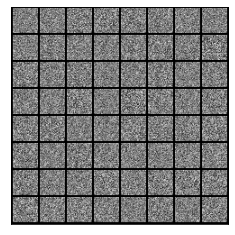

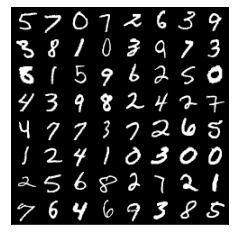

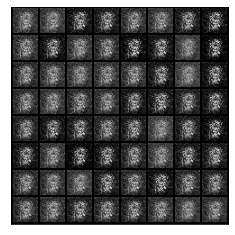

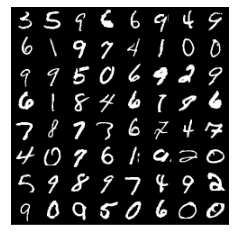

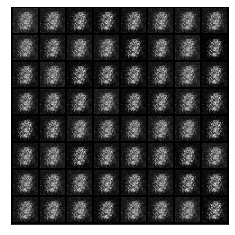

...

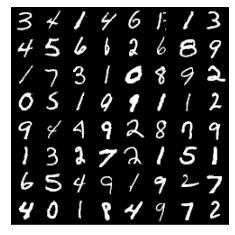

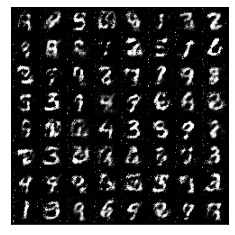

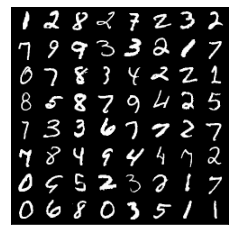

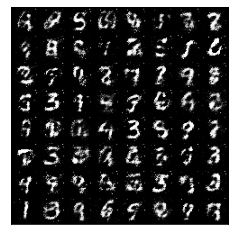

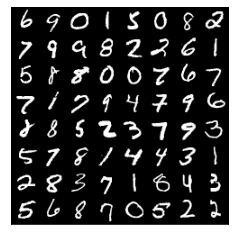

In [ ]:
for i in range(num_epochs):
    show(grid_fake[i])
    show(grid_real[i])

Email: arash.lagzian@gmail.com